## TBM Parameter Behaviour Assessment

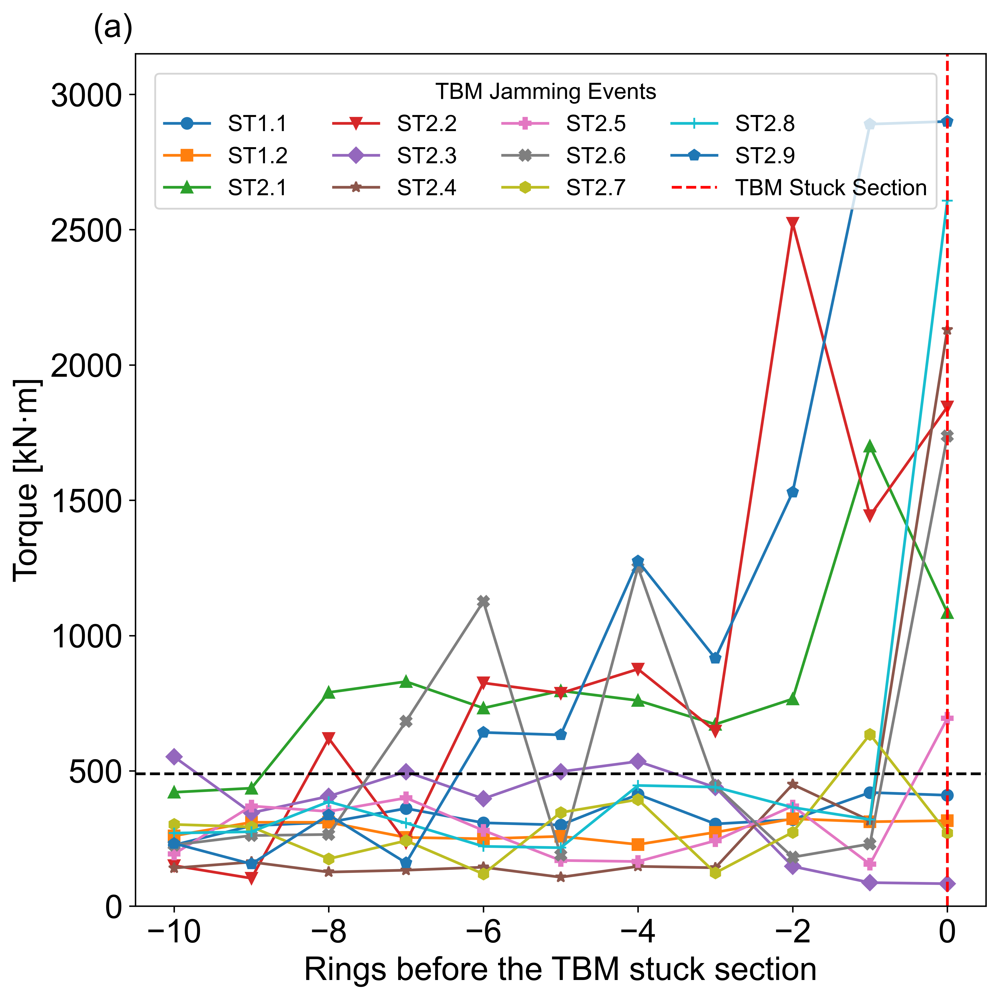

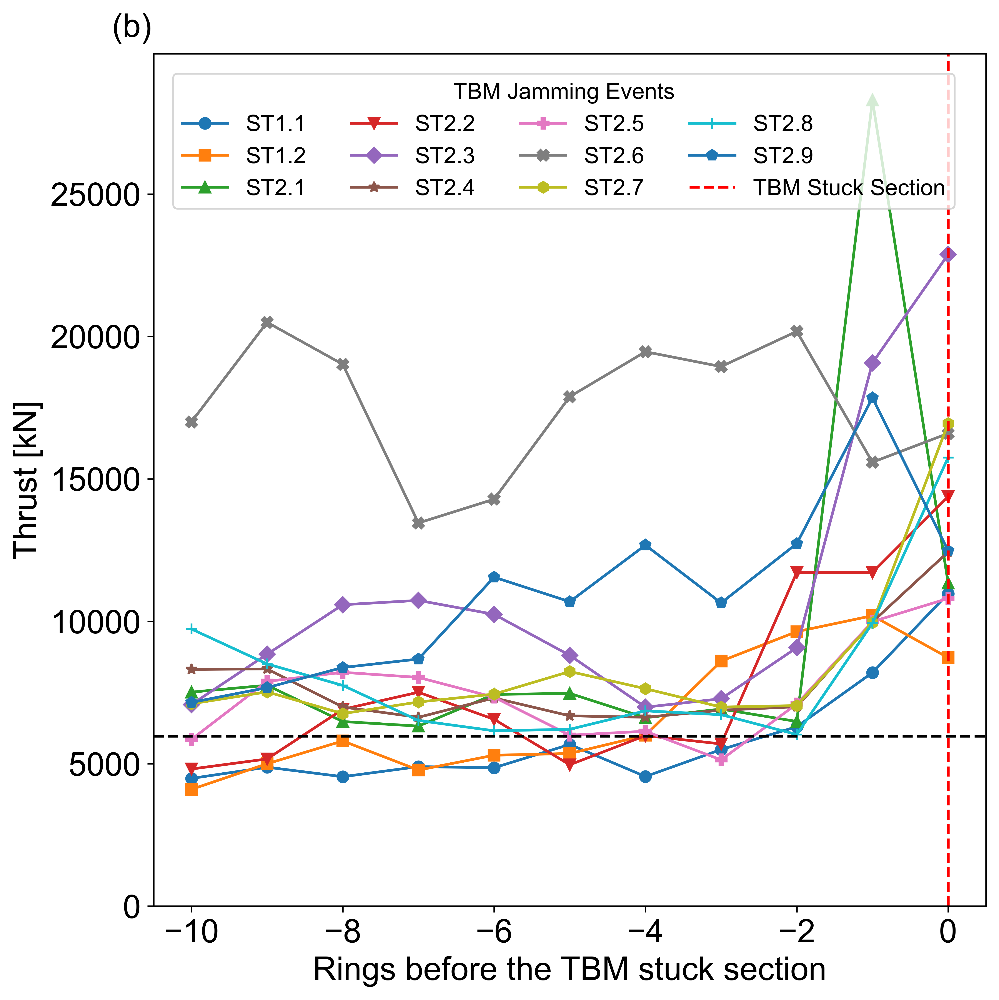

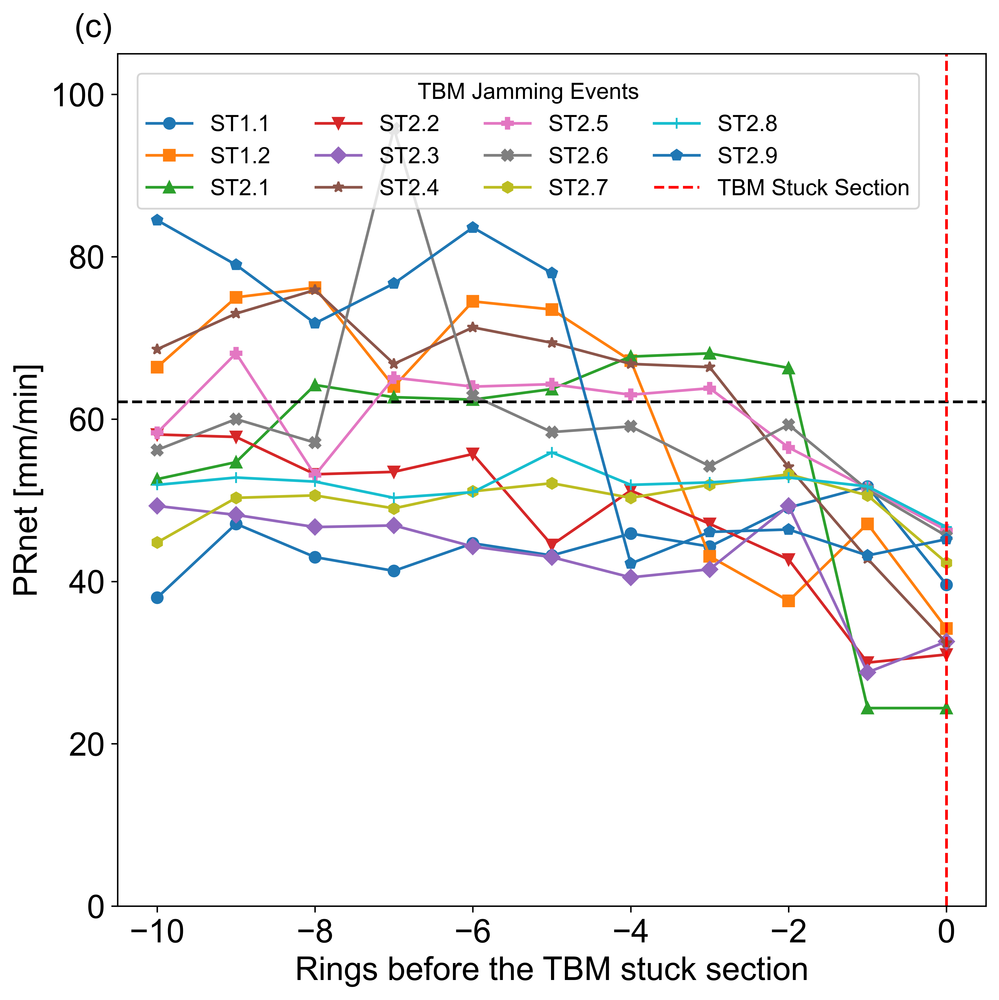

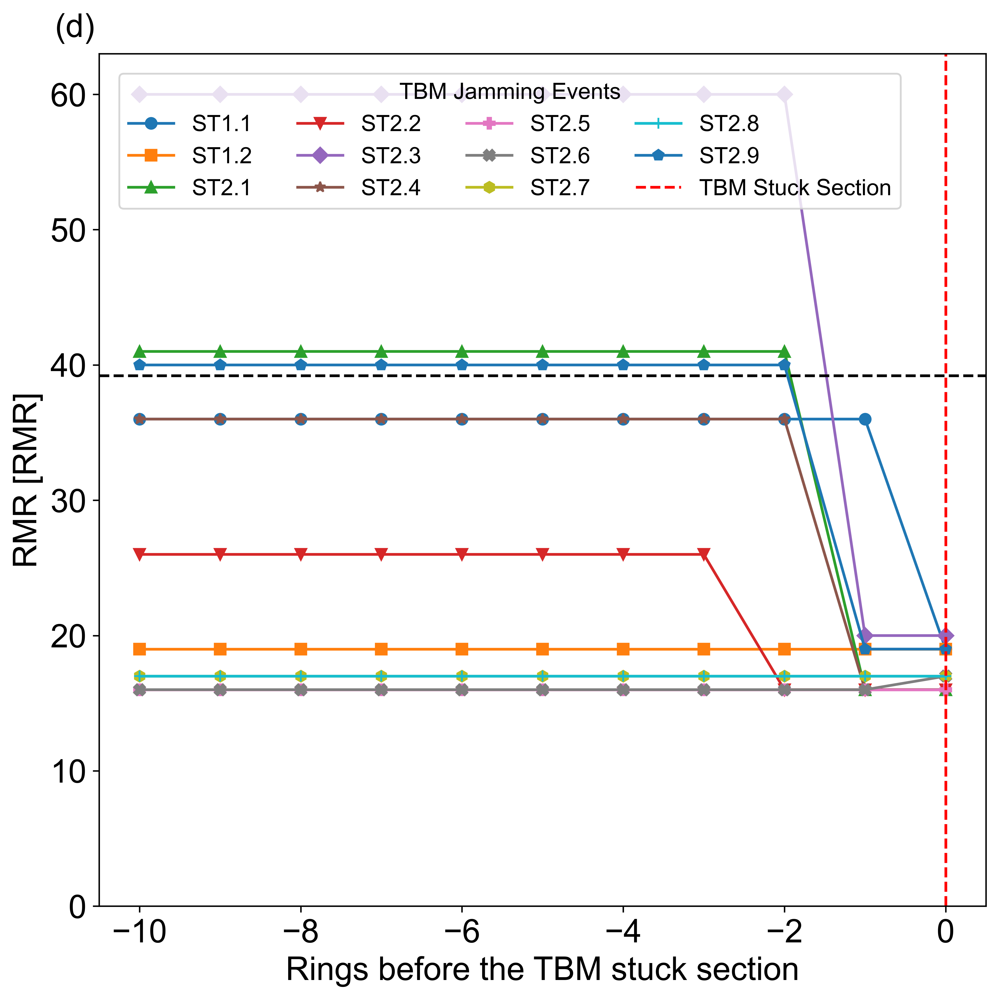

In [16]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import math
import numpy as np

# Set Arial font globally
mpl.rcParams['font.family'] = 'Arial'

# Load both sheets
file_path = 'Data from both TBM projects.xlsx'
df1 = pd.read_excel(file_path, sheet_name='BBDMP', engine='openpyxl')
df2 = pd.read_excel(file_path, sheet_name='SMDMP', engine='openpyxl')

# Add a source column for tracking
df1['Source'] = 'BBDMP'
df2['Source'] = 'SMDMP'

# Ensure 'Ring No.' is numeric
df1['Ring No.'] = pd.to_numeric(df1['Ring No.'], errors='coerce')
df2['Ring No.'] = pd.to_numeric(df2['Ring No.'], errors='coerce')

# Combine both dataframes
df = pd.concat([df1, df2], ignore_index=True)

# Define the TBM parameters
tbm_parameters = ['Torque', 'Thrust', 'PRnet', 'RMR']

# Calculate global mean (for plotting the mean line)
global_mean = df[tbm_parameters].mean()

# Sort each dataset by Ring No.
df1 = df1.sort_values('Ring No.').reset_index(drop=True)
df2 = df2.sort_values('Ring No.').reset_index(drop=True)

# Extract stuck sections from each sheet
stuck1 = df1[df1['Stuck Section'].astype(str).str.startswith(('ST1.', 'ST2.'))].copy()
stuck2 = df2[df2['Stuck Section'].astype(str).str.startswith('ST2.')].copy()

# Combine stuck sections and reset index
stuck_sections = pd.concat([stuck1, stuck2], ignore_index=True)

# Define 11 unique marker styles
marker_styles = ['o', 's', '^', 'v', 'D', '*', 'P', 'X', 'h', '+', 'p']

# Function to round up value to next multiple of step
def round_up(value, step):
    return math.ceil(value / step) * step

# Plotting function
def plot_raw_tbm_parameters(df, tbm_parameters, global_mean, stuck_sections):
    # Define custom step sizes per parameter
    step_sizes = {'Torque': 200, 'Thrust': 500, 'PRnet': 10, 'RMR': 5}

    # Subplot labels and filename labels
    subplot_labels = {
        'Torque': '(a)',
        'Thrust': '(b)',
        'PRnet': '(c)',
        'RMR': '(d)'
    }

    filename_labels = {
        'Torque': 'torque_stuck_section',
        'Thrust': 'thrust_stuck_section',
        'PRnet': 'PRnet_stuck_section',
        'RMR': 'RMR_stuck_section'
    }

    # Y-axis labels
    ylabel_map = {
        'Torque': 'Torque [kN·m]',
        'Thrust': 'Thrust [kN]',
        'PRnet': 'PRnet [mm/min]',
        'RMR': 'RMR [RMR]'
    }

    for param in tbm_parameters:
        plt.figure(figsize=(8, 8), dpi=600)
        all_values = []  # To collect y-values for dynamic ylim

        for i, row in stuck_sections.iterrows():
            stuck_ring = row['Ring No.']
            stuck_section = row['Stuck Section']

            # Filter the correct dataframe based on source
            df_subset = df[df['Source'] == row['Source']]

            # Get the last 10 rings before the stuck ring
            last_11_rings = df_subset[
                (df_subset['Ring No.'] <= stuck_ring) &
                (df_subset['Ring No.'] > stuck_ring - 11)
            ]

            if len(last_11_rings) < 5:
                continue

            marker = marker_styles[i % len(marker_styles)]
            all_values.extend(last_11_rings[param].dropna().tolist())

            plt.plot(
                last_11_rings['Ring No.'] - stuck_ring,
                last_11_rings[param],
                marker=marker,
                label=f'{stuck_section}'
            )

        # Global mean line
        plt.axhline(y=global_mean[param], color='black', linestyle='--', linewidth=1.5)

        # Stuck ring line
        plt.axvline(x=0, color='red', linestyle='--', label='TBM Stuck Section')

        # Subplot label
        if param in subplot_labels:
            plt.text(-0.05, 1.02, subplot_labels[param],
                     transform=plt.gca().transAxes, fontsize=18, ha='left')

        # Axis labels
        plt.xlabel('Rings before the TBM stuck section', fontsize=18)
        plt.ylabel(ylabel_map.get(param, param), fontsize=18)

        # Tick label sizes
        plt.xticks(fontsize=18)
        plt.yticks(fontsize=18)

        # Dynamic y-axis limits
        if all_values:
            ymin = min(all_values)
            ymax = max(all_values)

            step = step_sizes.get(param, 100)
            lower = max(0, min(0, ymin))  # Do not go below 0
            rounded_upper = round_up(ymax, step)
            buffer = 0.05 * rounded_upper
            upper = rounded_upper + buffer

            # For RMR, limit to max 100
            if param == 'RMR':
                upper = min(upper, 100)

            plt.ylim(lower, upper)

        # Legend
        plt.legend(title='TBM Jamming Events', bbox_to_anchor=(0.01, 0.99),
                   loc='upper left', ncol=4, fontsize=12.5, title_fontsize=12.5)

        plt.grid(False)
        plt.tight_layout()

        # Save figure
        filename = f"{subplot_labels[param]}_{filename_labels[param]}.png"
        plt.savefig(filename)
        plt.show()

# Run the plotting
plot_raw_tbm_parameters(df, tbm_parameters, global_mean, stuck_sections)

## Prediction of Potential Jamming Events

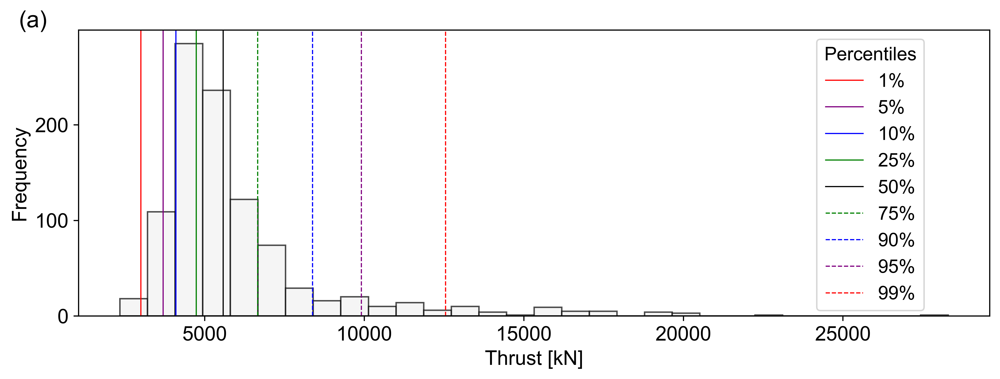

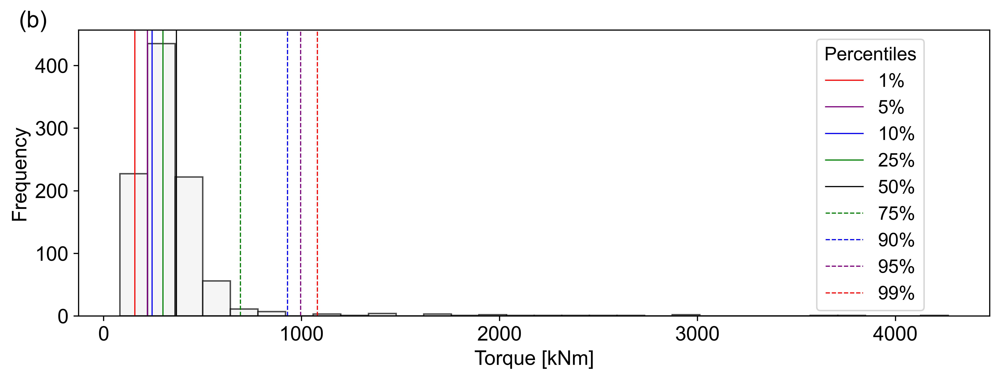

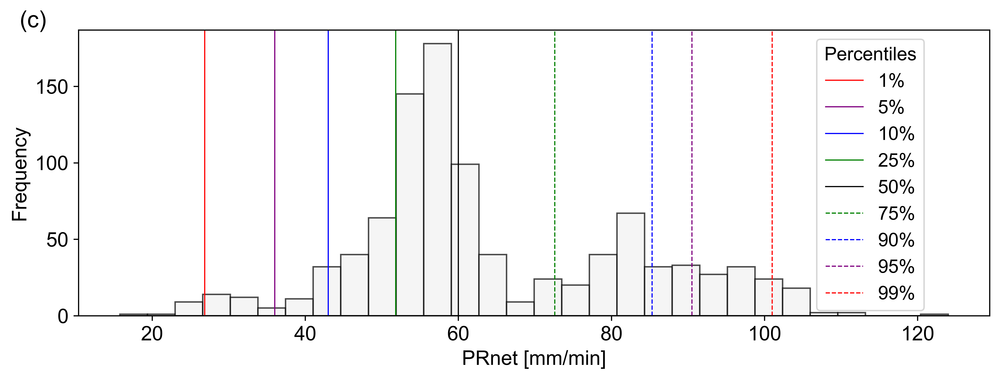

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

#Load both sheets [uploaded in above]
# Columns to plot (exclude RMR)
columns = ["Thrust", "Torque", "PRnet"]
units = ["[kN]", "[kNm]", "[mm/min]"]

# Titles with labels
subplot_labels = ["(a)", "(b)", "(c)"]

# Percentiles
percentiles = [1, 5, 10, 25, 50, 75, 90, 95, 99]

# Custom line style + color mapping
line_styles = {
    1:  ('red',    'solid'),
    5:  ('purple', 'solid'),
    10: ('blue',   'solid'),
    25: ('green',  'solid'),
    50: ('black',  'solid'),
    75: ('green',  'dashed'),
    90: ('blue',   'dashed'),
    95: ('purple', 'dashed'),
    99: ('red',    'dashed'),
}

# Compute percentiles based on combined dataset
percentile_dict = {}
for col in columns:
    percentile_dict[col] = np.percentile(
        df[col].dropna(), percentiles
    )

# Filter data for RMC = V
df_rmc_v = df[df['RMC'] == 'V'].copy()

# Plot histograms
for (column_name, unit, label) in zip(columns, units, subplot_labels):

    plt.figure(figsize=(10, 4), dpi=600)

    # Histogram
    plt.hist(
        data_rmc_v[column_name].dropna(), bins=30,
        color='#f2f2f2', edgecolor='black', alpha=0.7
    )

    # Plot percentile lines + build legend items
    legend_items = []
    for p, p_val in zip(percentiles, percentile_dict[column_name]):

        color, style = line_styles[p]

        line = plt.axvline(
            p_val,
            color=color,
            linestyle=style,
            linewidth=0.8,
            label=f"{p}%"        # legend label
        )

        legend_items.append(line)

    # Add legend (outside plot for clarity)
    plt.legend(handles=legend_items, title="Percentiles", fontsize=13, title_fontsize=13,
               bbox_to_anchor=(0.80, 1), loc="upper left")

    # Title with subplot label
    plt.title(f"{label}", fontsize=16, x=-0.05, y=0.98)

    plt.xlabel(f"{column_name} {unit}", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(False)
    plt.tight_layout()

    # Save figure
    filename = f"{label.replace('(','').replace(')','')}_{column_name}_distribution.png"
    plt.savefig(filename, bbox_inches='tight')
    plt.show()

## Applying Risk Prediction model

## Idetification of Possible Jamming Section
#1. Variability conditions identification for Thrust/Torque, PRnet 

#2. Classification with Combined jamming risk (CJR) score 

## 1.1 Variability level classification at "Stuck section"

In [18]:
# Parameters
tbm_parameters = ['Torque', 'Thrust', 'PRnet']

# Compute thresholds
def compute_thresholds(param, values):
    mean = values.mean()
    if param in ['Torque', 'Thrust']:
        return {
            'mean': mean,
            'p75': np.percentile(values, 75),
            'p95': np.percentile(values, 95)
        }
    elif param == 'PRnet':
        return {
            'mean': mean,
            'p25': np.percentile(values, 25),
            'p5': np.percentile(values, 5)
        }

thresholds_dict = {
    param: compute_thresholds(param, df[param].dropna())
    for param in tbm_parameters
}

# Get stuck sections
df1_stuck = df1[df1['Stuck Section'].fillna('').str.startswith(('ST1.', 'ST2.'))].reset_index(drop=True)
df2_stuck = df2[df2['Stuck Section'].fillna('').str.startswith(('ST1.', 'ST2.'))].reset_index(drop=True)
stuck_df = pd.concat([df1_stuck, df2_stuck], ignore_index=True)

# Variability classification function
def classify_variability(param, value, thresholds):
    if pd.isna(value):
        return 'Unknown'
    if param in ['Torque', 'Thrust']:
        if value > thresholds['p95']:
            return 'HV'
        elif thresholds['p75'] < value <= thresholds['p95']:
            return 'MV'
        elif thresholds['mean'] < value <= thresholds['p75']:
            return 'SV'
        else:
            return 'Normal'
    elif param == 'PRnet':
        if value < thresholds['p5']:
            return 'HV'
        elif thresholds['p5'] <= value < thresholds['p25']:
            return 'MV'
        elif thresholds['p25'] <= value < thresholds['mean']:
            return 'SV'
        else:
            return 'Normal'

# Generate variability classification table
variability_data = []

for idx, row in stuck_df.iterrows():
    entry = {'Stuck Section': row['Stuck Section']}
    for param in tbm_parameters:
        val = row[param]
        thresholds = thresholds_dict[param]
        level = classify_variability(param, val, thresholds)
        entry[f'{param} Variability'] = level
    variability_data.append(entry)

# Create dataframe
variability_df = pd.DataFrame(variability_data)

# Optional: Display clean table
print("\n--- Stuck Section Variability Summary ---\n")
print(variability_df.to_string(index=False))


--- Stuck Section Variability Summary ---

Stuck Section Torque Variability Thrust Variability PRnet Variability
        ST1.1             Normal                 HV                MV
        ST1.2             Normal                 MV                HV
        ST2.1                 HV                 HV                HV
        ST2.2                 HV                 HV                HV
        ST2.3             Normal                 HV                HV
        ST2.4                 HV                 HV                HV
        ST2.5                 MV                 HV                MV
        ST2.6                 HV                 HV                MV
        ST2.7             Normal                 HV                MV
        ST2.8                 HV                 HV                MV
        ST2.9                 HV                 HV                MV


## 1.2 one and Two ring before

In [23]:
VALID_RMC = 'V'
INVALID_RMC = ['III', 'IV']
RINGS_BEFORE = [1, 2]

for n in RINGS_BEFORE:

    variability_data = []

    for _, row in stuck_df.iterrows():

        # ✅ Only evaluate if STUCK ring itself is RMC V
        if str(row['RMC']) != VALID_RMC:
            continue

        stuck_ring = row['Ring No.']
        source = row['Source']

        prev_row = df[
            (df['Source'] == source) &
            (df['Ring No.'] == stuck_ring - n)
        ]

        entry = {
            'Stuck Section': row['Stuck Section'],
            'Source': source,
            'Stuck Ring': stuck_ring,
            f'Ring -{n}': stuck_ring - n
        }

        if not prev_row.empty:
            prev_row = prev_row.iloc[0]
            rmc_class = str(prev_row['RMC'])

            for param in tbm_parameters:
                if rmc_class in INVALID_RMC:
                    entry[f'{param} Variability'] = 'N/A'
                elif rmc_class == VALID_RMC:
                    entry[f'{param} Variability'] = classify_variability(
                        param,
                        prev_row[param],
                        thresholds_dict[param]
                    )
                else:
                    entry[f'{param} Variability'] = 'Unknown'
        else:
            for param in tbm_parameters:
                entry[f'{param} Variability'] = 'No data'

        variability_data.append(entry)

    variability_df = pd.DataFrame(variability_data)

    print(f"\n--- Variability {n} Ring(s) Before (Stuck Section) ---\n")
    print(variability_df.to_string(index=False))


--- Variability 1 Ring(s) Before (Stuck Section) ---

Stuck Section Source  Stuck Ring  Ring -1 Torque Variability Thrust Variability PRnet Variability
        ST1.1  BBDMP        6028     6027                N/A                N/A               N/A
        ST1.2  BBDMP        6041     6040             Normal                 HV                MV
        ST2.1  SMDMP        1503     1502                 HV                 HV                HV
        ST2.2  SMDMP        3286     3285                 HV                 HV                HV
        ST2.3  SMDMP        6536     6535             Normal                 HV                HV
        ST2.4  SMDMP        7434     7433             Normal                 HV                MV
        ST2.5  SMDMP        7451     7450             Normal                 HV                MV
        ST2.6  SMDMP        7473     7472             Normal                 HV                MV
        ST2.7  SMDMP        7492     7491                 SV   

## 2. Classification with Combined jamming risk (CJR) score

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
import matplotlib as mpl

# --- Load Excel Sheets ---
file_path = 'Data from both TBM projects.xlsx'
df1 = pd.read_excel(file_path, sheet_name='BBDMP', engine='openpyxl')
df2 = pd.read_excel(file_path, sheet_name='SMDMP', engine='openpyxl')

# Sort and label each dataset
df1 = df1.sort_values('Chainage').reset_index(drop=True)
df2 = df2.sort_values('Chainage').reset_index(drop=True)
df1['Sheet'] = 'BBDMP'
df2['Sheet'] = 'SMDMP'

# Combine both datasets for threshold calculation
df = pd.concat([df1, df2], ignore_index=True)

# --- TBM Parameters and Thresholds ---
tbm_parameters = ['Torque', 'Thrust', 'PRnet']

def compute_thresholds(param, values):
    mean = values.mean()
    if param in ['Torque', 'Thrust']:
        return {
            'mean': mean,
            'p75': np.percentile(values, 75),
            'p95': np.percentile(values, 95)
        }
    elif param == 'PRnet':
        return {
            'mean': mean,
            'p25': np.percentile(values, 25),
            'p5': np.percentile(values, 5)
        }

thresholds_dict = {
    param: compute_thresholds(param, df[param].dropna())
    for param in tbm_parameters
}

# --- Classify Variability ---
def classify_variability(param, value, thresholds):
    if pd.isna(value):
        return 'Unknown'
    if param in ['Torque', 'Thrust']:
        if value > thresholds['p95']:
            return 'Highly'
        elif thresholds['p75'] < value <= thresholds['p95']:
            return 'Moderately'
        elif thresholds['mean'] < value <= thresholds['p75']:
            return 'Slightly'
        else:
            return 'Stable'
    elif param == 'PRnet':
        if value < thresholds['p5']:
            return 'Highly'
        elif thresholds['p5'] <= value < thresholds['p25']:
            return 'Moderately'
        elif thresholds['p25'] <= value < thresholds['mean']:
            return 'Slightly'
        else:
            return 'Stable'

# --- Filter RMC = V ---
rmc_v_df = df[df_all['RMC'] == 'V'].copy()

# Apply variability classification
for param in tbm_parameters:
    rmc_v_df[param] = rmc_v_df[param].apply(lambda x: classify_variability(param, x, thresholds_dict[param]))

# --- Variability Score ---
score_map = {
    'Stable': 0,
    'Slightly': 1,
    'Moderately': 2,
    'Highly': 3
}

rmc_v_df['Thrust Score'] = rmc_v_df['Thrust'].map(score_map)
rmc_v_df['PRnet Score'] = rmc_v_df['PRnet'].map(score_map)

# Combined Jamming Risk Score
rmc_v_df['CJRS'] = rmc_v_df['Thrust Score'] + rmc_v_df['PRnet Score']

# --- Risk Level Classification ---
def label_risk(score):
    if score in [5, 6]:
        return 'High Risk'
    elif score in [3, 4]:
        return 'Medium Risk'
    elif score in [1, 2]:
        return 'Low Risk'
    elif score == 0:
        return 'No Risk'
    return 'Unknown'

rmc_v_df['Risk Level'] = rmc_v_df['CJRS'].apply(label_risk)

# --- Identify Original Stuck Sections ---
df1_stuck = df1[df1['Stuck Section'].fillna('').str.startswith(('ST1.', 'ST2.'))][['Chainage', 'Stuck Section']]
df2_stuck = df2[df2['Stuck Section'].fillna('').str.startswith(('ST1.', 'ST2.'))][['Chainage', 'Stuck Section']]
stuck_df = pd.concat([df1_stuck, df2_stuck], ignore_index=True)

# --- Merge original stuck section into Risk data ---
rmc_v_df = rmc_v_df.merge(stuck_df, on='Chainage', how='left', suffixes=('', '_original'))

# Keep original column clean
if 'Stuck Section' not in rmc_v_df.columns:
    rmc_v_df['Stuck Section'] = rmc_v_df['Stuck Section_original']

# --- Final Zone Classification ---
def define_zone(row):
    if row['Risk Level'] == 'High Risk':
        if pd.notna(row['Stuck Section']):
            return row['Stuck Section']  # actual stuck section
        else:
            return "Potential Jamming Zone"
    else:
        return "No Risk"

rmc_v_df['Defined Zone'] = rmc_v_df.apply(define_zone, axis=1)

# --- Output Columns ---
output_cols = [
    'Sheet', 'Chainage', 'Ring No.',
    'Thrust', 'PRnet', 'CJRS', 'Risk Level',
    'Stuck Section', 'Defined Zone'
]

# --- Separate by Project ---
all_risk_bbmdp = rmc_v_df[rmc_v_df['Sheet'] == 'BBDMP']
all_risk_smdmp = rmc_v_df[rmc_v_df['Sheet'] == 'SMDMP']

# --- Print Results ---
print("\n--- All Risk Levels (RMC = V) ---\n")

print("Project: BBDMP")
print(all_risk_bbmdp[output_cols].to_string(index=False))

print("\nProject: SMDMP")
print(all_risk_smdmp[output_cols].to_string(index=False))


--- All Risk Levels (RMC = V) ---

Project: BBDMP
Sheet  Chainage  Ring No.     Thrust      PRnet  CJRS  Risk Level Stuck Section           Defined Zone
BBDMP     150.7         1     Stable     Highly     3 Medium Risk           NaN                No Risk
BBDMP     152.1         2     Stable     Highly     3 Medium Risk           NaN                No Risk
BBDMP     153.5         3     Stable     Highly     3 Medium Risk           NaN                No Risk
BBDMP     154.9         4     Stable     Highly     3 Medium Risk           NaN                No Risk
BBDMP     156.3         5     Stable     Highly     3 Medium Risk           NaN                No Risk
BBDMP     157.7         6     Stable     Highly     3 Medium Risk           NaN                No Risk
BBDMP     159.1         7     Stable     Highly     3 Medium Risk           NaN                No Risk
BBDMP     160.5         8     Stable     Highly     3 Medium Risk           NaN                No Risk
BBDMP     161.9       

## Save Output to Excel

In [35]:
# --- Save Output to Excel ---

save_path = "Risk_Classification.xlsx"

with pd.ExcelWriter(save_path, engine='openpyxl') as writer:
    all_risk_bbmdp[output_cols].to_excel(writer, sheet_name="BBDMP", index=False)
    all_risk_smdmp[output_cols].to_excel(writer, sheet_name="SMDMP", index=False)

print(f"\nFile saved successfully as: {save_path}")


File saved successfully as: Risk_Classification.xlsx


## 2.1 Idetification of Possible Jamming Section

In [36]:
# --- Filter High-Risk Rings from already computed rmc_v_df ---
high_risk = rmc_v_df[rmc_v_df['Risk Level'] == 'High Risk'].copy()

# --- Merge with Stuck Section Info ---
# reuse stuck_df from code 1
high_risk = high_risk.merge(stuck_df, on='Chainage', how='left')

# Combine stuck section columns if needed
if 'Stuck Section_x' in high_risk.columns:
    high_risk['Stuck Section'] = high_risk['Stuck Section_x'].combine_first(high_risk['Stuck Section_y'])
    high_risk['Stuck Section'] = high_risk['Stuck Section'].fillna('Potential Jamming Zone')
    high_risk.drop(columns=['Stuck Section_x','Stuck Section_y'], inplace=True)
else:
    high_risk['Stuck Section'] = high_risk['Stuck Section'].fillna('Potential Jamming Zone')

# --- Output Columns ---
output_cols = ['Sheet','Chainage','Ring No.','Thrust','PRnet','CJRS','Risk Level','Stuck Section']

# --- Separate by Project and Print ---
for project in ['BBDMP','SMDMP']:
    print(f"\nProject: {project}")
    print(high_risk[high_risk['Sheet']==project][output_cols].to_string(index=False))


Project: BBDMP
Sheet  Chainage  Ring No.     Thrust      PRnet  CJRS Risk Level          Stuck Section
BBDMP    8588.5      6028     Highly Moderately     5  High Risk                  ST1.1
BBDMP    8605.3      6040     Highly Moderately     5  High Risk Potential Jamming Zone
BBDMP    8606.7      6041 Moderately     Highly     5  High Risk                  ST1.2

Project: SMDMP
Sheet  Chainage  Ring No.     Thrust      PRnet  CJRS Risk Level          Stuck Section
SMDMP  2155.271      1502     Highly     Highly     6  High Risk Potential Jamming Zone
SMDMP  2156.678      1503     Highly     Highly     6  High Risk                  ST2.1
SMDMP  2157.326      1504 Moderately     Highly     5  High Risk Potential Jamming Zone
SMDMP  4667.717      3284     Highly Moderately     5  High Risk Potential Jamming Zone
SMDMP  4668.125      3285     Highly     Highly     6  High Risk Potential Jamming Zone
SMDMP  4669.332      3286     Highly     Highly     6  High Risk                  ST2.2


## Prediction of Possible Jamming section along the whole Tunnel section
## 1. Risk Level Class presentation with different color

In [9]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import pandas as pd
import numpy as np

mpl.rcParams['font.family'] = 'Arial'
plt.rcParams.update({'font.size': 18})

# --- Background shading function with dynamic limit ---
def apply_background_shading(ax, param, combined_values, thresholds, y_min, y_max):
    x_min, x_max = ax.get_xlim()

    if param in ['Torque', 'Thrust']:
        zones = [
            (thresholds['p95'], y_max, 'Highly Variable', 'red', 0.2),
            (thresholds['p75'], thresholds['p95'], 'Moderately Variable', 'orange', 0.4),
            (thresholds['mean'], thresholds['p75'], 'Slightly Variable', 'cyan', 0.3), #Light blue color = #91bfdb
            (y_min, thresholds['mean'], 'Normal', 'lightblue', 0.3)
        ]
    elif param == 'PRnet':
        zones = [
            (y_min, thresholds['p5'], 'Highly Variable', 'red', 0.2),
            (thresholds['p5'], thresholds['p25'], 'Moderately Variable', 'orange', 0.4),
            (thresholds['p25'], thresholds['mean'], 'Slightly Variable', 'cyan', 0.3),
            (thresholds['mean'], y_max, 'Normal', 'lightblue', 0.3)
        ]
    else:
        return

    manual_x_pos = 200  # set your desired fixed x-coordinate here
    
    for y_start, y_end, label, color, alpha in zones:
        shaded_start = max(y_start, y_min)
        shaded_end = min(y_end, y_max)
        if shaded_start >= shaded_end:
            continue
        ax.axhspan(shaded_start, shaded_end, facecolor=color, alpha=alpha)
        y_pos = (shaded_start + shaded_end) / 2
        ax.text(manual_x_pos, y_pos, label, va='center', ha='left', fontsize=15, alpha=1, color='black')

# --- Main plotting function ---
def plot_sheet(df, high_risk_df, title, filename):
    fig = plt.figure(figsize=(16, 14), dpi=600)
    gs = gridspec.GridSpec(nrows=4, ncols=1, height_ratios=[1, 1, 1, 0.3])
    axs = [fig.add_subplot(gs[i]) for i in range(4)]

    start_chainage = int(df['Chainage'].min())
    end_chainage = int(df['Chainage'].max())
    xticks = list(range(start_chainage, end_chainage + 1, 500))
    if end_chainage not in xticks:
        xticks.append(end_chainage)

    for i, param in enumerate(tbm_parameters):
        ax = axs[i]
        combined_values = df_all[param].dropna()
        thresholds = thresholds_dict[param]

        ax.set_xlim(start_chainage, end_chainage)

        # ---- Set custom y-axis ticks ----
        if title == "a)":
            if param == 'Torque':
                yticks = np.arange(0, 1000 + 1, 100)
            elif param == 'Thrust':
                yticks = np.arange(2000, 12000 + 1, 2000)
            elif param == 'PRnet':
                yticks = np.arange(0, 140 + 1, 20)
        elif title == "b)":
            if param == 'Torque':
                yticks = np.arange(0, 4500 + 1, 500)
            elif param == 'Thrust':
                yticks = np.arange(2000, 32000 + 1, 5000)
            elif param == 'PRnet':
                yticks = np.arange(0, 120 + 1, 20)
        else:
            yticks = None

        if yticks is not None:
            ax.set_yticks(yticks)
            ax.set_ylim(yticks[0], yticks[-1])
            y_min, y_max = yticks[0], yticks[-1]
        else:
            y_min, y_max = df[param].min(), df[param].max()

        apply_background_shading(ax, param, combined_values, thresholds, y_min, y_max)
        # Plot points
        for idx, row in df.iterrows():
            ch = row['Chainage']
            val = row[param]
            if pd.isna(val):
                continue

            rmc = str(row['RMC']).strip()

            if rmc in ['III', 'IV']:
                ax.plot(ch, val, 'o', color='grey', markersize=3)

            elif rmc == 'V':
                match = rmc_v_df[rmc_v_df['Chainage'] == ch]
                if not match.empty:
                    risk = match['Risk Level'].values[0]

                    # Legend-matching marker + color
                    risk_marker_map = {'No Risk': 'o', 'Low Risk': 's', 'Medium Risk': '*'}
                    risk_color_map = {'No Risk': 'green', 'Low Risk': 'blue', 'Medium Risk': 'magenta'}
                    risk_size_map   = {'No Risk': 7, 'Low Risk': 7, 'Medium Risk': 10}

                    marker = risk_marker_map.get(risk, 'o')
                    color = risk_color_map.get(risk, 'grey')
                    size   = risk_size_map.get(risk, 6)
                    
                    # Plot
                    ax.plot(ch, val, marker=marker, color=color, markersize=size)
                    

        # Highlight high-risk or stuck zones
        for _, row in high_risk_df.iterrows():
            ch = row['Chainage']
            val = df.loc[df['Chainage'] == ch, param].values
            if len(val) == 0 or pd.isna(val[0]):
                continue
            if isinstance(row['Stuck Section'], str) and row['Stuck Section'].startswith(('ST1.', 'ST2.')):
                ax.plot(ch, val[0], marker='X', color='black', markersize=10)
            elif row['Stuck Section'] == 'Potential Jamming Zone':
                ax.plot(
                    ch, val[0],
                    marker='^',          # triangle (warning)
                    markerfacecolor='yellow',
                    markeredgecolor='red',
                    markersize=9,
                    markeredgewidth=2
                )

        ax.set_ylabel(param_labels[param])
        ax.grid(True, color='grey', alpha=0.3)

        # Legend
        legend_elements = [
            plt.Line2D([0], [0], marker='o', color='grey', label='RMC III & IV', linestyle='', markersize=10),
            plt.Line2D([0], [0], marker='o', color='green', label='No Risk', linestyle='', markersize=10),
            plt.Line2D([0], [0], marker='s', color='blue', label='Low Risk', linestyle='', markersize=10),
            plt.Line2D([0], [0], marker='*', color='magenta', label='Medium Risk', linestyle='', markersize=10),
            plt.Line2D([0], [0], marker='X', color='black', label='TBM Stuck Section', linestyle='', markersize=10),
            plt.Line2D([0], [0], marker='^', linestyle='',markersize=10, 
                       markerfacecolor='yellow',markeredgecolor='red',markeredgewidth=2, label='Potential Jamming Zone')
        ]
        ax.legend(handles=legend_elements, loc='upper left', ncol=3, bbox_to_anchor=(0.16, 1.02), fontsize=15)
        ax.set_xticks(xticks)
        ax.set_xticklabels([])

    # RMC coloring row
    ax_rmc = axs[-1]
    for i in range(1, len(df)):
        r1, r2 = df.iloc[i - 1], df.iloc[i]
        if pd.notna(r1['RMC']):
            color = rmc_colors.get(str(r1['RMC']).strip(), '#cccccc')
            ax_rmc.axvspan(r1['Chainage'], r2['Chainage'], facecolor=color, alpha=0.4)

    ax_rmc.set_ylabel("RMC")
    rmc_patches = [plt.Line2D([0], [0], color=color, lw=10, label=f'RMC {rmc}') for rmc, color in rmc_colors.items()]
    ax_rmc.legend(handles=rmc_patches, loc='upper left', ncol=3, bbox_to_anchor=(0, 1.02), fontsize=13)
    ax_rmc.set_xlabel("Chainage")
    ax_rmc.set_yticks([])
    ax_rmc.set_xlim(start_chainage, end_chainage)
    ax_rmc.set_xticks(xticks)
    ax_rmc.set_xticklabels([str(tick) for tick in xticks], rotation=90)
    ax_rmc.grid(True, color='grey', alpha=0.3)

    
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    fig.savefig(filename, bbox_inches='tight')
    plt.show()

# --- Run plotting ---
plot_sheet(df1, high_risk_bbmdp, title="", filename="Figure_A.png")
plot_sheet(df2, high_risk_smdmp, title="", filename="Figure_B.png")

## TBM Jamming Risk Classification

In [38]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.utils import resample
import matplotlib.pyplot as plt

# -------------------------------------------------------
# 1. Load your saved Risk Classification File
# -------------------------------------------------------

file_path = "Risk_Classification.xlsx"

df1 = pd.read_excel(file_path, sheet_name="BBDMP")
df2 = pd.read_excel(file_path, sheet_name="SMDMP")

df = pd.concat([df1, df2], ignore_index=True)

# -------------------------------------------------------
# 2. CLEANING RULES FOR DEFINED ZONE USING RING SEQUENCES
# -------------------------------------------------------

def clean_defined_zone(df):
    df = df.sort_values("Ring No.").reset_index(drop=True)

    # 1. Identify actual jam rings
    actual_jams = df.loc[
        df["Stuck Section"].fillna('').str.startswith(("ST1.", "ST2.")),
        "Ring No."
    ].tolist()

    # ----------- RULE A: REMOVE continuous PZ around each actual jam -----------
    for R in actual_jams:

        # Before actual jam (R-1, R-2, ...)
        ring = R - 1
        while ring in df["Ring No."].values:
            idx = df.index[df["Ring No."] == ring][0]
            if df.at[idx, "Defined Zone"] == "Potential Jamming Zone":
                df.at[idx, "Defined Zone"] = "No risk"
                ring -= 1
            else:
                break

        # After actual jam (R+1, R+2, ...)
        ring = R + 1
        while ring in df["Ring No."].values:
            idx = df.index[df["Ring No."] == ring][0]
            if df.at[idx, "Defined Zone"] == "Potential Jamming Zone":
                df.at[idx, "Defined Zone"] = "No risk"
                ring += 1
            else:
                break

    # ----------- RULE B: Reduce distant clusters to only last element -----------
    pz_rings = df.loc[df["Defined Zone"] == "Potential Jamming Zone", "Ring No."].tolist()

    clusters = []
    cluster = []

    for r in sorted(pz_rings):
        if not cluster:
            cluster = [r]
        elif r == cluster[-1] + 1:
            cluster.append(r)
        else:
            clusters.append(cluster)
            cluster = [r]
    if cluster:
        clusters.append(cluster)

    # Keep only last ring of each distant cluster
    for cluster in clusters:
        # If cluster touches actual jam location, skip it (already cleaned earlier)
        touches_actual = False
        for r in cluster:
            if any(abs(r - aj) == 1 for aj in actual_jams):
                touches_actual = True
                break

        if touches_actual:
            continue  # skip clusters connected to actual jam

        # Keep only last ring
        for r in cluster[:-1]:
            idx = df.index[df["Ring No."] == r][0]
            df.at[idx, "Defined Zone"] = "No risk"

    return df


# Apply cleaning
df = clean_defined_zone(df)

# -------------------------------------------------------
# 3. Create Ground Truth (Actual Jamming)
# -------------------------------------------------------

df['is_actual_jam'] = df['Stuck Section'].fillna('').apply(
    lambda x: 1 if str(x).startswith(('ST1.', 'ST2.')) else 0
)

# -------------------------------------------------------
# 4. Create Predicted Label (Defined Zone)
# -------------------------------------------------------

def predicted_jam(x):
    if isinstance(x, str) and x.startswith(("ST1.", "ST2.")):
        return 1  # actual stuck zones predicted correctly
    if x == "Potential Jamming Zone":
        return 1  # predicted as risk zone
    return 0     # No Risk = negative class

df['is_predicted_jam'] = df['Defined Zone'].apply(predicted_jam)

# -------------------------------------------------------
# 5. Prepare values for metrics
# -------------------------------------------------------

y_true = df['is_actual_jam'].values
y_pred = df['is_predicted_jam'].values
y_score = df['CJRS'].values

# -------------------------------------------------------
# 6. Confusion Matrix and Metrics
# -------------------------------------------------------

tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

sensitivity = tp / (tp + fn) if tp + fn > 0 else np.nan
specificity = tn / (tn + fp) if tn + fp > 0 else np.nan
accuracy = (tp + tn) / len(y_true)

print("\n========== CLASSIFICATION PERFORMANCE ==========")
print(f"Sensitivity (TPR): {sensitivity:.3f}")
print(f"Specificity (TNR): {specificity:.3f}")
print(f"Accuracy: {accuracy:.3f}")

# Matrix format
correct_format_matrix = np.array([[tp, fn],
                                  [fp, tn]])

print("\nConfusion Matrix [TP FN; FP TN]:")
print(correct_format_matrix)

# -------------------------------------------------------
# 8. Bootstrap 95% CI for AUC, Sensitivity, Specificity
# -------------------------------------------------------

def bootstrap_ci(df, n=2000):
    auc_list, sens_list, spec_list = [], [], []

    for _ in range(n):
        boot = df.sample(n=len(df), replace=True)

        yt = boot['is_actual_jam'].values
        ys = boot['CJRS'].values
        yp = boot['is_predicted_jam'].values

        # AUC
        if len(np.unique(yt)) > 1:
            fpr_b, tpr_b, _ = roc_curve(yt, ys)
            auc_list.append(auc(fpr_b, tpr_b))

        # Sensitivity/Specificity
        tn_b, fp_b, fn_b, tp_b = confusion_matrix(yt, yp).ravel()

        sens_list.append(tp_b / (tp_b + fn_b) if tp_b + fn_b > 0 else np.nan)
        spec_list.append(tn_b / (tn_b + fp_b) if tn_b + fp_b > 0 else np.nan)

    return {
        "AUC_CI": np.nanpercentile(auc_list, [2.5, 97.5]),
        "Sens_CI": np.nanpercentile(sens_list, [2.5, 97.5]),
        "Spec_CI": np.nanpercentile(spec_list, [2.5, 97.5])
    }

ci = bootstrap_ci(df)

print("\n========== 95% CONFIDENCE INTERVALS ==========")
print(f"AUC 95% CI: {ci['AUC_CI']}")
print(f"Sensitivity 95% CI: {ci['Sens_CI']}")
print(f"Specificity 95% CI: {ci['Spec_CI']}")


========== CLASSIFICATION PERFORMANCE ==========
Sensitivity (TPR): 1.000
Specificity (TNR): 0.996
Accuracy: 0.996

Confusion Matrix [TP FN; FP TN]:
[[ 11   0]
 [  4 967]]

========== 95% CONFIDENCE INTERVALS ==========
AUC 95% CI: [0.9675068  0.98696531]
Sensitivity 95% CI: [1. 1.]
Specificity 95% CI: [0.99172699 0.99897333]


## Confusion matrix with heat map

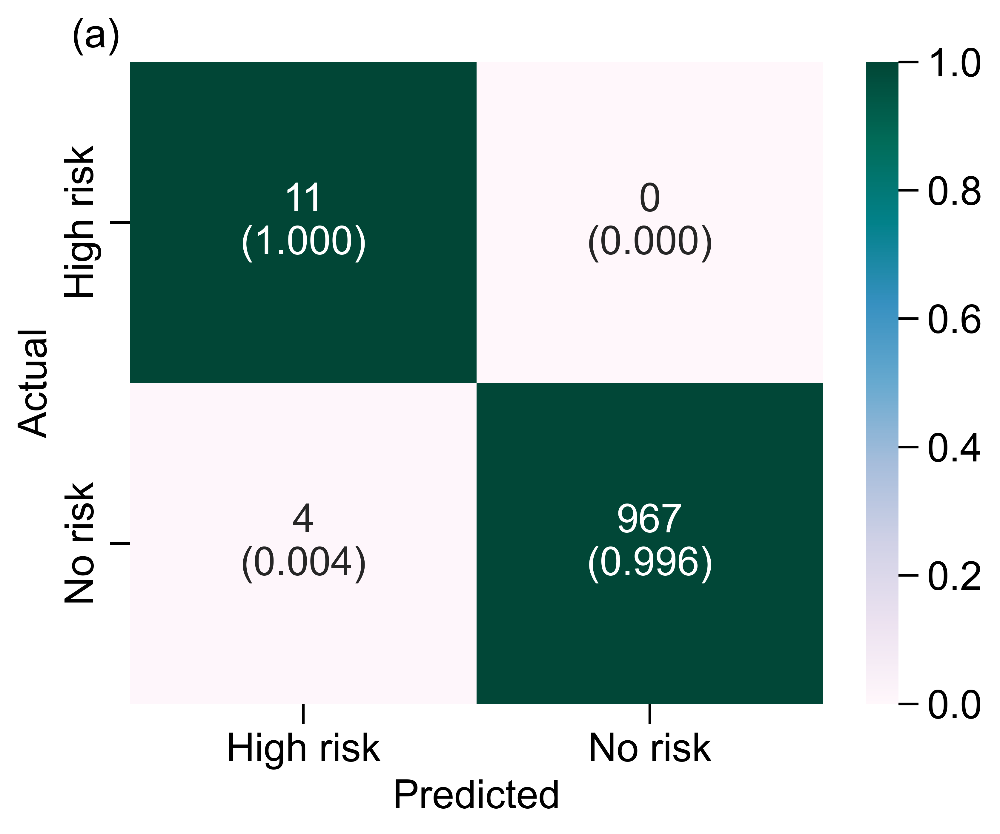

In [41]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
mpl.rcParams['font.family'] = 'Arial'

# Confusion matrix in [TP FN; FP TN]
cm = correct_format_matrix

# Row-wise decimals (recall-based)
cm_row_sum = cm.sum(axis=1, keepdims=True)
cm_percent = cm / cm_row_sum   # decimals, not %

# Annotation labels
labels = np.array([[f"{cm[i,j]}\n({cm_percent[i,j]:.3f})"
                    for j in range(cm.shape[1])]
                   for i in range(cm.shape[0])])

plt.figure(figsize=(6,5), dpi = 600)
ax = sns.heatmap(
    cm_percent,            
    annot=labels,            
    fmt="",                
    cmap="PuBuGn",           
    xticklabels=["High risk", "No risk"],
    yticklabels=["High risk", "No risk"],
    annot_kws={"size": 16}   
)

# --- Change colorbar text size ---
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=16,length=8, width=1, colors='black') 

plt.title("(a)", x=-0.05, y=1.0, fontsize=16)
plt.xlabel("Predicted", fontsize=16)
plt.ylabel("Actual", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tick_params(axis='both', which='both', length=8, width=1)
plt.tight_layout() 
plt.savefig("(a) confusion_matrix.png",bbox_inches='tight')
plt.show()


ROC-AUC (CJRS Score): 0.978


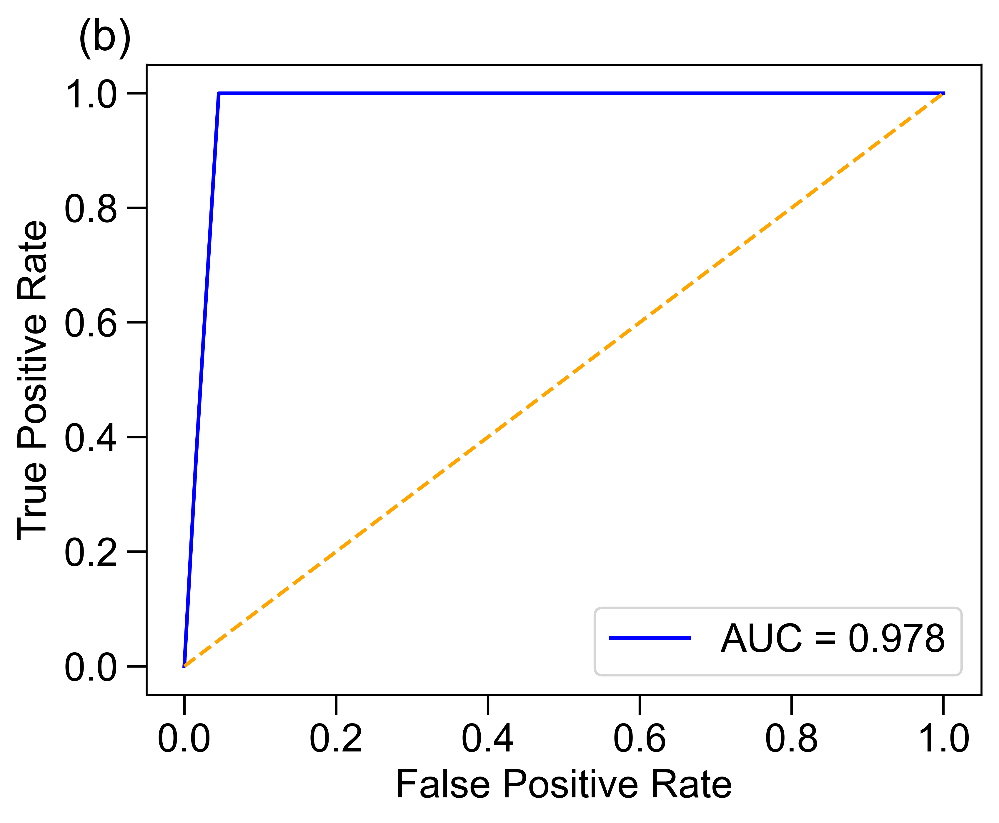

In [42]:
# -------------------------------------------------------
# 7. ROC-AUC using CJRS continuous score
# -------------------------------------------------------

fpr, tpr, _ = roc_curve(y_true, y_score)
roc_auc = auc(fpr, tpr)

print(f"\nROC-AUC (CJRS Score): {roc_auc:.3f}")


# -------------------------------------------------------
# 9. Plot ROC Curve
# -------------------------------------------------------
mpl.rcParams['font.family'] = 'Arial'

plt.figure(figsize=(6, 5), dpi = 600)
plt.plot(fpr, tpr, color = 'blue', label=f"AUC = {roc_auc:.3f}")
plt.plot([0, 1], [0, 1], '--', color ='orange')
plt.xlabel("False Positive Rate", fontsize=16)
plt.ylabel("True Positive Rate", fontsize=16)
plt.title("(b)", x=-0.05, y=1.0, fontsize=18)
# Tick label size and tick mark size
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tick_params(axis='both', which='both', length=8, width=1)
plt.legend(fontsize=16)
plt.grid(False)
plt.tight_layout() 
plt.savefig("(b) ROC AUC.png", bbox_inches='tight')
plt.show()

## Descriptive Statistics for Selected Parameters:Based on the RMC

In [43]:
# --- Select Specific Parameters and Include RMC ---
selected_params = ['RMC', 'CRS', 'PRchd', 'Torque', 'Thrust', 'PRnet']
df_selected = df_all[selected_params].copy()

# --- Define percentiles ---
percentiles = [0.05, 0.10, 0.25, 0.5, 0.75, 0.90, 0.95]

# --- Group by RMC and calculate descriptive stats ---
grouped_stats = {}
for rmc_class in ['III', 'IV', 'V']:
    group_df = df_selected[df_selected['RMC'] == rmc_class].drop(columns='RMC')
    stats = group_df.describe(percentiles=percentiles).round(2)
    grouped_stats[rmc_class] = stats
    print(f"\n--- Descriptive Statistics for RMC {rmc_class} ---")
    print(stats)


--- Descriptive Statistics for RMC III ---
           CRS    PRchd   Torque    Thrust    PRnet
count  8416.00  8416.00  8416.00   8416.00  8416.00
mean      7.09     7.49   624.19   6899.17    52.68
std       0.71     1.78   278.47   1991.38    12.06
min       2.60     1.60   135.00   2292.00     9.60
5%        6.00     4.50   278.00   4550.00    31.25
10%       6.50     5.10   312.00   4925.00    36.00
25%       7.00     6.30   357.50   5553.00    45.80
50%       7.00     7.50   605.50   6400.00    53.10
75%       7.25     8.60   895.00   7791.50    60.40
90%       8.00     9.60   997.00   9775.00    66.90
95%       8.00    10.20  1042.00  11219.00    71.00
max       9.00    15.60  1348.00  21650.00   104.30

--- Descriptive Statistics for RMC IV ---
           CRS    PRchd   Torque    Thrust    PRnet
count  8686.00  8686.00  8686.00   8686.00  8686.00
mean      7.20     9.94   374.63   5071.70    71.05
std       0.86     1.98   171.03   1190.86    14.35
min       3.50     4.10    82

## Range of Parameters (25% to 75%)

In [45]:
# --- Define percentiles ---
percentiles = [0.25, 0.5, 0.75]

# --- Group by RMC and calculate only selected percentiles ---
grouped_percentiles = {}
for rmc_class in ['III', 'IV', 'V']:
    group_df = df_selected[df_selected['RMC'] == rmc_class].drop(columns='RMC')
    desc = group_df.describe(percentiles=percentiles).round(2)
    
    # Filter only the selected percentiles
    selected_desc = desc.loc[[f'{int(p*100)}%' for p in percentiles]]
    grouped_percentiles[rmc_class] = selected_desc
    print(f"\n--- RMC Class: {rmc_class} ---")
    print(selected_desc)


--- RMC Class: III ---
      CRS  PRchd  Torque  Thrust  PRnet
25%  7.00    6.3   357.5  5553.0   45.8
50%  7.00    7.5   605.5  6400.0   53.1
75%  7.25    8.6   895.0  7791.5   60.4

--- RMC Class: IV ---
     CRS  PRchd  Torque  Thrust  PRnet
25%  6.8    8.5   265.0  4300.0   59.3
50%  7.0    9.7   320.0  4987.0   70.1
75%  8.0   11.3   403.0  5657.0   82.3

--- RMC Class: V ---
     CRS  PRchd  Torque   Thrust  PRnet
25%  5.0    8.7  229.25  4422.75   53.2
50%  6.0   11.0  298.25  5222.50   58.8
75%  7.0   13.0  394.00  6420.50   80.0
